


---


# **Generating Pop Art Image Using Style Transfer**



---


Comp432 Project - Winter 2023<br>
Deokyeong Kim (26942105)





## **Abstract**

The aim of this project is to create a deep learning model that generates pop art through the insertion of a human face image and a style image. To achieve this, the project utilizes transfer learning techniques by leveraging the pre-trained VGG19 model layers in PyTorch to extract relevant features.

## **Methodology**

Ordinary photos can lack impact, but by transforming them into pop art, individuals can create memorable family or couple photos. The solution provided in this porject allows users to easily create pop art using a photo of their face.



  This project is inspired by '**Image Style Transfer Using Convolutional Neural Networks**,'(Gatys et al., 1970), and **'Neural Transfer Using Pytorch,'** (Jacq, n.d.) . The method of style transfer in the paper [1] involves taking a single noise image, a content image, and a style image. The goal is to make both the content and style loss as small as possible by updating the noise image towards the direction of minimizing them.


  Specifically, I will be creating pop art of human faces using a pre-trained VGG19 model and exploring the ideas behind style transfer, while also making various attempts to achieve the best possible results.


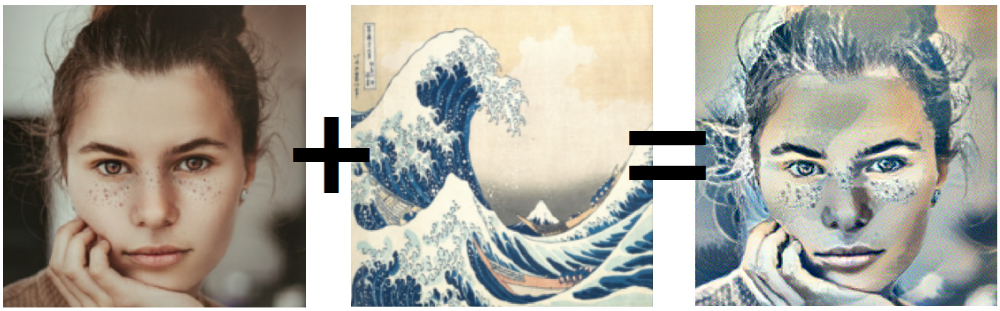

## **Libraries and Environment Setup**

In [ ]:
# libraries
import torch
from torchvision import transforms
from PIL import Image
import torchvision.models as models
import matplotlib.pyplot as plt
import torch.nn as nn
import torch.optim as optim
import copy

In [ ]:
# create device object for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
def load_image_to_tensor(image_path, height=224, width=224):
    """
    Load an image and transform it into a PyTorch tensor, ready to be used as input for a neural network.

    Arguments
    ---------
        image_path (str): Path to the image file.
        height (int): Desired height of the image after resizing. Default is 224.
        width (int): Desired width of the image after resizing. Default is 224.

    Returns
    -------
        torch.Tensor: A 4D tensor of shape (batch, channel, height, width) representing the loaded image.
            The tensor is moved to the device(GPU) specified by the `device` global variable.

    """

    transform = transforms.Compose(
        [
            transforms.Resize((height, width)),  # resize image
            transforms.ToTensor(),  # convert image to tensor
        ]
    )

    image = Image.open(image_path)  # open image
    tensor_image = transform(image).unsqueeze(
        0
    )  # transform to tensor # unsqueeze to represent batch size at position 0
    return tensor_image.to(
        device, torch.float
    )  # move to gpu, change data type of the tensor from uint8 to float


def show_tensor_image(tensor_image, figsize=(5, 5)):
    """
    Show a PyTorch tensor as an image using matplotlib.

    Arguments
    ---------
        tensor_image (torch.Tensor): A 4D tensor of shape (1, C, H, W) representing the image.
        figsize (tuple): A tuple specifying the figure size in inches. Default is (5,5).

    Returns:
        None

    """

    # move to cpu, remove batch demension, convert to PIL image object
    PIL_image = transforms.ToPILImage()(tensor_image.cpu().clone().squeeze(0))

    fig = plt.figure(figsize=figsize)
    plt.imshow(PIL_image)  # show image using matplotlib

    plt.show()

### **Dataset used**

There are three **content images** and two **style images** used in this project. The content images are human face images retrieved from 'Unsplash.com'. The style images are retrieved from two different museum websites. The URLs can be found in the reference section at the end.



Images are available in the github below.

In [ ]:
# colne repository from github to get images
!git clone https://github.com/happyduck93/style_transfer_face
%cd style_transfer_face

Cloning into 'style_transfer_face'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 41 (delta 6), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (41/41), 4.60 MiB | 8.47 MiB/s, done.
/content/style_transfer_face


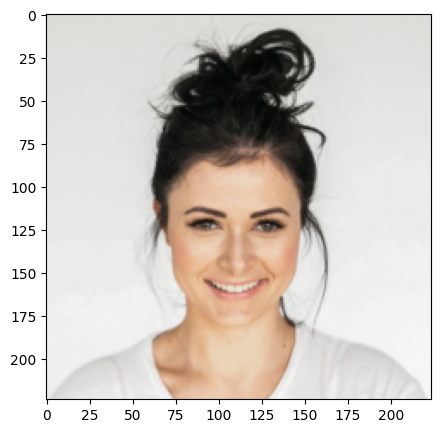

In [ ]:
# load and show sample content image
img_path = "./images/content_img_1.jpg"
content_image_1 = load_image_to_tensor(img_path)
show_tensor_image(content_image_1)

(Nackos, J., Woman in white crew neck shirt smiling,(2020))

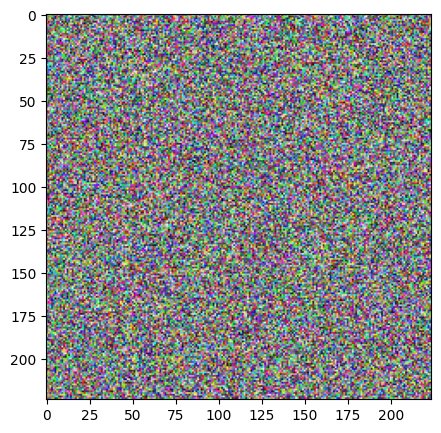

tensor([[[[0.7377, 0.5056, 0.4939,  ..., 0.7387, 0.7975, 0.0794],
          [0.3869, 0.7219, 0.3422,  ..., 0.1107, 0.8486, 0.5758],
          [0.1299, 0.3092, 0.9624,  ..., 0.7810, 0.6858, 0.7392],
          ...,
          [0.4562, 0.6622, 0.8565,  ..., 0.6031, 0.1741, 0.3455],
          [0.8469, 0.8443, 0.3398,  ..., 0.8665, 0.4883, 0.0578],
          [0.6342, 0.6889, 0.0343,  ..., 0.6756, 0.4794, 0.4337]],

         [[0.0088, 0.9017, 0.7871,  ..., 0.4103, 0.2025, 0.5320],
          [0.6366, 0.4969, 0.8304,  ..., 0.1791, 0.7464, 0.2341],
          [0.6526, 0.6792, 0.9169,  ..., 0.0273, 0.5737, 0.6504],
          ...,
          [0.7230, 0.7390, 0.5077,  ..., 0.2488, 0.8794, 0.2833],
          [0.5797, 0.6094, 0.6891,  ..., 0.9541, 0.4948, 0.4272],
          [0.3547, 0.2167, 0.5321,  ..., 0.7570, 0.0470, 0.2830]],

         [[0.8563, 0.0637, 0.7809,  ..., 0.2393, 0.9418, 0.3389],
          [0.8255, 0.2705, 0.0171,  ..., 0.9209, 0.4396, 0.6677],
          [0.4712, 0.6298, 0.3265,  ..., 0

In [ ]:
# create a random noise image

noise_image = torch.empty_like(content_image_1).uniform_(
    0, 1
)  # random tensor values between 0~1, same size as the content_image
show_tensor_image(noise_image)  # show the noise image

print(noise_image)  # check the tensor values

## **Face Image Reconstruction**

$L_{content}(\vec{p}, \vec{x}, l) = \frac{1}{2}\sum_{i,j}(F_{ij}^l - P_{ij}^l)^2$

Eq.(1) from the paper [1]

The mean squared error loss is used to minimize the gap between the content image and the noise image. The mean squared error is gradually reduced by updating each pixel of the noise image.

In [ ]:
def update_noise_to_match_content(
    noise_image, content_image, n_iterations=200, learning_rate=1e3, progress=False
):
    """
    Update a noise image to match the content of a given content image using gradient descent.

    Arguments
    ---------
        noise_image (torch.Tensor): A 4D tensor of shape (1, C, H, W) representing the noise image.
        content_image (torch.Tensor): A 4D tensor of shape (1, C, H, W) representing the content image.
        n_iterations (int): The number of iterations to run the optimization. Default is 200.
        learning_rate (float): The learning rate to use for the gradient descent. Default is 1000.
        progress (bool): Whether to show the progress of the optimization by displaying the noise image every 20 iterations. Default is False.

    Returns
    -------
        torch.Tensor: A 4D tensor of shape (1, C, H, W) representing the updated noise image.

    """
    # MSE loss for content image
    mse_loss = nn.MSELoss()

    # noise_image to start with
    if progress == True:
        show_tensor_image(noise_image)

    # for number of iterations
    for i in range(n_iterations):
        noise_image.requires_grad = True
        output_loss = mse_loss(noise_image, content_image)  # calculate loss
        output_loss.backward()  # backpropagation
        new_gradient = learning_rate * noise_image.grad  # calculate new gradient

        # update the noise image with the new gradient
        # clamp function ensures the pixel values lie between 0 and 1
        noise_image = torch.clamp(noise_image - new_gradient, 0, 1).detach_()

        # print the update progress of nosie image to content image
        if progress and (i + 1) % 20 == 0:
            print(f"this is {i+1}")
            show_tensor_image(noise_image)

    if progress == False:
        return noise_image

In [ ]:
update_noise_to_match_content(noise_image, content_image_1, progress=True)

### **Learning Rate Comparison**

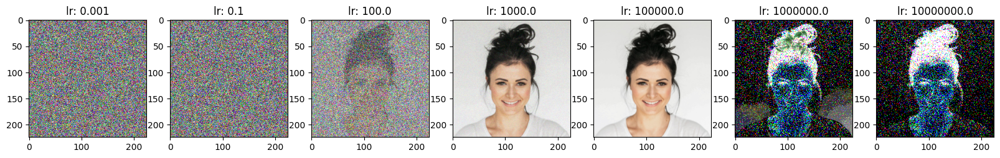

In [ ]:
test_lr = [1e-3, 1e-1, 1e2, 1e3, 1e5, 1e6, 1e7]

fig, axs = plt.subplots(1, len(test_lr), figsize=(20, 5))

for i, lr in enumerate(test_lr):
    img = update_noise_to_match_content(
        noise_image, content_image_1, learning_rate=lr, progress=False
    )

    axs[i].set_title(f"lr: {lr}")
    axs[i].imshow(img.cpu().squeeze(0).numpy().transpose(1, 2, 0))

**Observation:** This shows that the learning rates of 1e3 and 1e5 worked better than the other rates. This is likely because the noise image was too far from the content image, requiring a relatively high learning rate to escape local minima.

## **Style Reconstruction**


**Style** represents the **correlation between different features**. Such correlation is represented by a **Gram Matrix**, and if the Gram Matrices of two images are similar, we can say that they have a similar style. If an image has n features in a layer, then its Gram Matrix is an n * n matrix.

The style loss is calculated by selecting multiple layers and computing the loss (E_l) at each layer. Then, the losses are weighted and summed to obtain the final style loss.



$E_{l} = \frac{1}{4N^2M^2}\sum_{i=1}^{N}\sum_{j=1}^{M} (G_{ij}^l - A_{ij}^l)^2$

Eq.(4) from paper [1]


$L_{style} = \sum_{i=1}^{n}w_iE_{l}$


Eq.(5) from paper [1]

### **Introducing Gram Matrix**

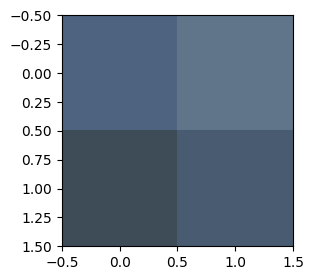

torch.Size([1, 3, 2, 2])

In [ ]:
img_path = img_path = "./images/style_img_1.jpg"
style_test_image = load_image_to_tensor(img_path, height=2, width=2)
show_tensor_image(style_test_image, figsize=(3, 3))

style_test_image.size()

**Observation:** As you can see this 2*2 pixel image contains 3 channels. Each represent R,G,B. The actual gram matrix is calculated on the activation values (= output of model upto the chosen activation layer ). However, we will assume this tensor as activaton values, to simply shows the steps of the gram matrix calculation since the activation layer does not change the size of the tensor.

### **Calculating first element of Gram Matrix**

In [ ]:
# this tensor contains 3 features
style_test_image

tensor([[[[0.3059, 0.3765],
          [0.2431, 0.2824]],

         [[0.3882, 0.4588],
          [0.2980, 0.3569]],

         [[0.4980, 0.5412],
          [0.3412, 0.4431]]]], device='cuda:0')

In [ ]:
# size() returns batch_size, channels, height, weight
b, c, h, w = style_test_image.size()

# choose first feature
feature_1 = style_test_image[0][0]

# to calculate gram matrix, we need to flatten the image cell into vector representation
feature_1_flatten = feature_1.view(1, h * w)

feature_1_flatten

tensor([[0.3059, 0.3765, 0.2431, 0.2824]], device='cuda:0')

In [ ]:
# calculating correlation between feature_1 and itself
G11 = torch.mm(feature_1_flatten, feature_1_flatten.t())

G11

tensor([[0.3741]], device='cuda:0')

In [ ]:
# normalize
G11_normalized = G11 / (c * h * w)
G11_normalized

tensor([[0.0312]], device='cuda:0')

similarly each feature will have correlation value with another feature. Thus the output gram matrix will have 3*3 matrix as an output.

### **Calculating Gram Matrix for one layer**

In [ ]:
# the image has batch_size = 1 , channels = 3, height=2, width=2
batch, channel, height, width = style_test_image.size()

In [ ]:
# flatten the image to vector form
features = style_test_image.view(channel, height * width)

# compute gram matrix
gram = torch.mm(features, features.t())

# normalization
gram_normalized = gram / (channel * height * width)

gram_normalized

tensor([[0.0312, 0.0387, 0.0470],
        [0.0387, 0.0481, 0.0585],
        [0.0470, 0.0585, 0.0711]], device='cuda:0')

**Observation:** as you can see the resulting gram matrix is 3*3 and the first element is same as we calculated above.  

### **Gram Matrix**

In [ ]:
def gram_matrix(tensor_features):
    """
    Calculates the Gram matrix for a given features.

    Arguments
    ---------
        tensor_features (torch.Tensor): A 4D tensor of shape (batch_size, channels, height, width)
            containing a batch of feature maps.

    Returns
    -------
        torch.Tensor: A Gram matrix of shape (channels, channels) computed from the input tensor.
            Each element in the Gram matrix represents the inner product between the feature vectors
            of two channels in the input tensor, normalized by the number of elements (channels*height*width).
    """

    batch_size, channels, height, width = tensor_features.size()

    # reshape feature to vector form
    matrix_features = tensor_features.view(
        channels, height * width
    )  # resize tensor to matrix. each feature is represented as vector (h*w)

    # compute gram matrix
    Gram = torch.mm(matrix_features, matrix_features.t())

    # Normalize
    gram_normalized = Gram.div(channels * height * width)

    return gram_normalized

In [ ]:
# input to gram_matrix function
style_test_image

tensor([[[[0.3059, 0.3765],
          [0.2431, 0.2824]],

         [[0.3882, 0.4588],
          [0.2980, 0.3569]],

         [[0.4980, 0.5412],
          [0.3412, 0.4431]]]], device='cuda:0')

In [ ]:
# output
gram_matrix(style_test_image)

tensor([[0.0312, 0.0387, 0.0470],
        [0.0387, 0.0481, 0.0585],
        [0.0470, 0.0585, 0.0711]], device='cuda:0')

**Observation**: The output of gram_matrix is same as we calculated above.

### **Style reconstruction using VGG19 model**


In [ ]:
# loading pretrained vgg19 model

vgg_model = models.vgg19(pretrained=True).features.to(device).eval()

print(vgg_model)

/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.9/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:02<00:00, 263MB/s]


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

### **Normalization**

In [ ]:
# normalization
# input image should be normalized with same mean and standard deviation used to train vgg19 model to improve performance of the model

vgg19_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
vgg19_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

In [ ]:
class Normalization(nn.Module):

    """
    Normalization module that standardizes input image by subtracting mean and dividing by standard deviation.

    Arguments
    ---------
    mean (torch.Tensor): A tensor of size 3 containing the mean values for each channel (R,G,B).
    std (torch.Tensor): A tensor of size 3 containing the standard deviation values for each channel (R,G,B).

    Attributes
    ----------
    mean (torch.Tensor): A tensor of shape (3, 1, 1) representing the mean pixel value for each channel (R,G,B).
    std (torch.Tensor): A tensor of shape (3, 1, 1) representing the standard deviation of pixel value for each channel (R,G,B).

    Methods
    -------
    forward(img): Standardizes the input image by subtracting mean and dividing by standard deviation.

    """

    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.reshape(vgg19_mean, (3, 1, 1))
        self.std = torch.reshape(vgg19_std, (3, 1, 1))

    def forward(self, img):
        return (img - self.mean) / self.std

In [ ]:
# initialize Normalization object
norm = Normalization(vgg19_mean, vgg19_std)

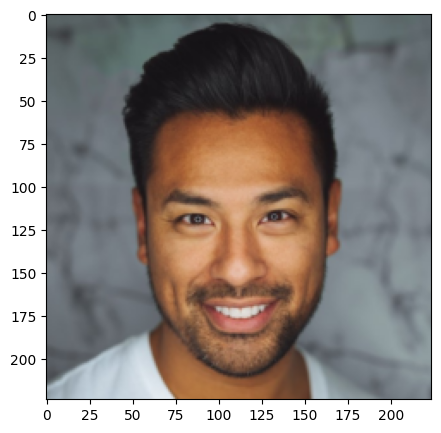

tensor([[[[0.3490, 0.3490, 0.3490,  ..., 0.3647, 0.3686, 0.3686],
          [0.3490, 0.3490, 0.3490,  ..., 0.3647, 0.3686, 0.3686],
          [0.3490, 0.3490, 0.3490,  ..., 0.3647, 0.3647, 0.3686],
          ...,
          [0.5490, 0.5608, 0.5804,  ..., 0.4824, 0.4510, 0.4157],
          [0.5569, 0.5765, 0.5882,  ..., 0.4824, 0.4510, 0.4196],
          [0.5686, 0.5882, 0.6078,  ..., 0.4824, 0.4588, 0.4235]],

         [[0.3882, 0.3882, 0.3882,  ..., 0.4000, 0.4039, 0.4039],
          [0.3882, 0.3882, 0.3882,  ..., 0.4000, 0.4039, 0.4039],
          [0.3882, 0.3882, 0.3882,  ..., 0.4000, 0.4000, 0.4039],
          ...,
          [0.6000, 0.6118, 0.6353,  ..., 0.5176, 0.4824, 0.4431],
          [0.6078, 0.6275, 0.6431,  ..., 0.5176, 0.4863, 0.4471],
          [0.6196, 0.6431, 0.6627,  ..., 0.5176, 0.4863, 0.4510]],

         [[0.3922, 0.3922, 0.3922,  ..., 0.4196, 0.4235, 0.4235],
          [0.3922, 0.3922, 0.3922,  ..., 0.4196, 0.4235, 0.4235],
          [0.3922, 0.3922, 0.3922,  ..., 0

In [ ]:
# content_image_2
img_path = "./images/content_img_2.jpg"
content_image_2 = load_image_to_tensor(img_path)
show_tensor_image(content_image_2)
content_image_2

(Gonzalez, Man wearing white B-neck shirt, 2017)

In [ ]:
# result of normalized content_image_2
norm(content_image_2)

tensor([[[[-0.5938, -0.5938, -0.5938,  ..., -0.5253, -0.5082, -0.5082],
          [-0.5938, -0.5938, -0.5938,  ..., -0.5253, -0.5082, -0.5082],
          [-0.5938, -0.5938, -0.5938,  ..., -0.5253, -0.5253, -0.5082],
          ...,
          [ 0.2796,  0.3309,  0.4166,  ..., -0.0116, -0.1486, -0.3027],
          [ 0.3138,  0.3994,  0.4508,  ..., -0.0116, -0.1486, -0.2856],
          [ 0.3652,  0.4508,  0.5364,  ..., -0.0116, -0.1143, -0.2684]],

         [[-0.3025, -0.3025, -0.3025,  ..., -0.2500, -0.2325, -0.2325],
          [-0.3025, -0.3025, -0.3025,  ..., -0.2500, -0.2325, -0.2325],
          [-0.3025, -0.3025, -0.3025,  ..., -0.2500, -0.2500, -0.2325],
          ...,
          [ 0.6429,  0.6954,  0.8004,  ...,  0.2752,  0.1176, -0.0574],
          [ 0.6779,  0.7654,  0.8354,  ...,  0.2752,  0.1352, -0.0399],
          [ 0.7304,  0.8354,  0.9230,  ...,  0.2752,  0.1352, -0.0224]],

         [[-0.0615, -0.0615, -0.0615,  ...,  0.0605,  0.0779,  0.0779],
          [-0.0615, -0.0615, -

### **Style Loss for Multiple Layers**

How many Conv2d layers in vgg19 model?

In [ ]:
num_conv = 0

for layer in vgg_model:
    if isinstance(layer, nn.Conv2d):
        num_conv += 1 # count only for the conv2d layers

print(f"Threre are {num_conv} Con2d layer in vgg19 model.")

Threre are 16 Con2d layer in vgg19 model.


### **Rename layers**

Rename layer to follow the naming of the original paper [1].

In [ ]:
pre_trained_model = copy.deepcopy(vgg_model)

test_model = nn.Sequential()
i = 1
j = 0
for layer in vgg_model.children():
    if isinstance(layer, nn.Conv2d):
        j += 1  # untill we encounter conv2d layer
        name = f"conv{i}_{j}"
    elif isinstance(layer, nn.ReLU):
        name = f"relu{i}_{j}"
        layer = nn.ReLU(inplace=False)
    elif isinstance(layer, nn.MaxPool2d):
        name = f"pool{i}"
        i += 1  # untill we encounter maxpool layer
        j = 0

    else:
        raise RuntimeError(f"Unrecognized layer: {layer.__class__.__name__}")

    test_model.add_module(name, layer)

test_model

Sequential(
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1_1): ReLU()
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu1_2): ReLU()
  (pool1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv2_1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_1): ReLU()
  (conv2_2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu2_2): ReLU()
  (pool2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (conv3_1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_1): ReLU()
  (conv3_2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_2): ReLU()
  (conv3_3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_3): ReLU()
  (conv3_4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (relu3_4): ReLU()
  (pool3): Max

### **Conv2d layers**

The layers chosen fromt this list can be used to extract features later on.

In [ ]:
# Get all the names of vgg19 model
vgg_conv_layers = []
for name, layer in test_model.named_children():
    if isinstance(layer, nn.Conv2d):
        vgg_conv_layers.append(name)

print(vgg_conv_layers)

['conv1_1', 'conv1_2', 'conv2_1', 'conv2_2', 'conv3_1', 'conv3_2', 'conv3_3', 'conv3_4', 'conv4_1', 'conv4_2', 'conv4_3', 'conv4_4', 'conv5_1', 'conv5_2', 'conv5_3', 'conv5_4']


### **Styele losses**

In [ ]:
def reconstruct_model_with_style_losses(
    pre_trained_model, style_image, style_layers_list
):
    """
    Reconstructs a pre-trained model with added StyleLoss objects for the chosen layers based on a given style image.
    This is a helper function used inside 'reconstruct_style_image' function defined latter part of this project.

    Arguments
    ---------
    - pre_trained_model (nn.Module): A pre-trained convolutional neural network model.
    - style_image (torch.Tensor): A style image tensor.
    - style_layers_list (List[str]): A list of layer names to calculate style loss.

    Returns
    -------
    - A new nn.Module object that contains the original pre-trained model and additional StyleLoss objects.


    Reference
    ---------
    -Based on Jacq's work on Neural transfer using PyTorch (Jacq, 2021), I re-wrote the code.
    """

    # pytorch's neural network library has nn.Module class, which is base class of neural network module.
    # the forward method is automatically called when the object is called.
    class StyleLoss(nn.Module):
        # initialization
        def __init__(
            self, target_tensor_features
        ):  # target is the chosen layer in style_image
            super(StyleLoss, self).__init__()
            self.target_style = gram_matrix(
                target_tensor_features
            ).detach()  # define target style and set to instance attribute

        # when the object is called, get gram_matrix for updating image then compute loss with gram_matrix for target style image
        def forward(self, input_tensor_features):
            input_gram = gram_matrix(input_tensor_features)
            self.loss = nn.functional.mse_loss(input_gram, self.target_style)
            return input_tensor_features

    # given mean and std for vgg19
    vgg19_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    vgg19_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    # initialize normalization object
    normalization = Normalization(vgg19_mean, vgg19_std).to(device)
    style_losses = []  # will contain losses for multiple layers. One loss per layer.

    # initialize sequential obejct to make our own model
    my_model = nn.Sequential()

    # make sure the input image to my_model is nomralized
    my_model.add_module("normalization", normalization)

    # deepcopy pre_trained_model to not to change by accident
    pre_trained_model = copy.deepcopy(pre_trained_model)

    i = 1
    j = 0
    for layer in vgg_model.children():
        if isinstance(layer, nn.Conv2d):
            j += 1  # untill we encounter conv2d layer
            name = f"conv{i}_{j}"
        elif isinstance(layer, nn.ReLU):
            name = f"relu{i}_{j}"
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f"pool{i}"
            i += 1  # untill we encounter maxpool layer
            j = 0

        else:
            raise RuntimeError(f"Unrecognized layer: {layer.__class__.__name__}")

        my_model.add_module(name, layer)

        # calculate loss up untill the chosen layers
        if name in style_layers_list:
            style_tensor_features = my_model(
                style_image
            ).detach()  # extract activation values of a chosen layer
            style_loss_obj = StyleLoss(
                style_tensor_features
            )  # initialize StyleLoss object

            my_model.add_module(
                f"styleLossObj{i}_{j}", style_loss_obj
            )  # add that object to our sequential model
            style_losses.append(style_loss_obj)  # append to style_losses lislt

    # cut model upto the last styleLossObj layer
    for k in range(len(my_model) - 1, -1, -1):
        if isinstance(my_model[k], StyleLoss):
            break
    my_model = my_model[: (k + 1)]

    return my_model, style_losses

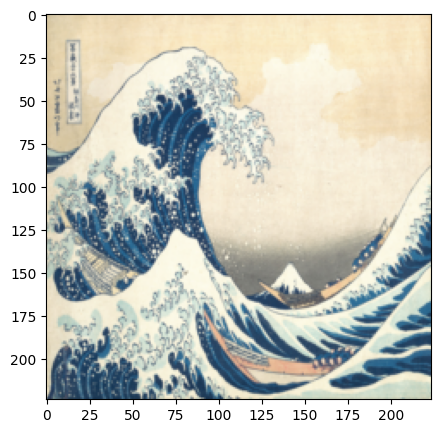

tensor([[[[0.8039, 0.8078, 0.8196,  ..., 0.9451, 0.9255, 0.9098],
          [0.7922, 0.8118, 0.8157,  ..., 0.9451, 0.9412, 0.9176],
          [0.8235, 0.8353, 0.8314,  ..., 0.9490, 0.9412, 0.9176],
          ...,
          [0.9412, 0.5216, 0.1725,  ..., 0.7804, 0.7843, 0.7725],
          [0.7961, 0.2863, 0.1765,  ..., 0.7843, 0.7608, 0.7686],
          [0.4235, 0.1882, 0.1804,  ..., 0.7647, 0.7608, 0.8353]],

         [[0.7412, 0.7490, 0.7686,  ..., 0.8627, 0.8431, 0.8353],
          [0.7294, 0.7529, 0.7608,  ..., 0.8588, 0.8471, 0.8157],
          [0.7569, 0.7765, 0.7765,  ..., 0.8667, 0.8471, 0.8118],
          ...,
          [0.8941, 0.5412, 0.2549,  ..., 0.8275, 0.8235, 0.8157],
          [0.7804, 0.3412, 0.2510,  ..., 0.8196, 0.8078, 0.8039],
          [0.4667, 0.2510, 0.2353,  ..., 0.7843, 0.7843, 0.8235]],

         [[0.6039, 0.6196, 0.6431,  ..., 0.7216, 0.6941, 0.7059],
          [0.5882, 0.6157, 0.6314,  ..., 0.7020, 0.6941, 0.6510],
          [0.6118, 0.6353, 0.6471,  ..., 0

In [ ]:
img_path = "./images/style_img_2.jpg"
style_image_2 = load_image_to_tensor(img_path)
show_tensor_image(style_image_2)
style_image_2

(Katsushika , Under the Wave off Kanagawa, (ca. 1830–32))

In [ ]:
style_layers_list = ["conv1_1", "conv1_2"]

In [ ]:
# testing 'reconstruct_model_with_style_losses' function
my_model, style_losses = reconstruct_model_with_style_losses(
    vgg_model, style_image_2, style_layers_list
)

In [ ]:
# This model contains layers upto the last loss object
my_model

Sequential(
  (normalization): Normalization()
  (conv1_1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (styleLossObj1_1): StyleLoss()
  (relu1_1): ReLU()
  (conv1_2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (styleLossObj1_2): StyleLoss()
)

In [ ]:
# This list contains all the style loss object. One object per layer
style_losses

[StyleLoss(), StyleLoss()]

In [ ]:
# accessing target style of layer 'conv1_1'
style_losses[0].target_style

tensor([[ 0.0253,  0.0062,  0.0258,  ..., -0.0121,  0.0003,  0.0081],
        [ 0.0062,  0.0482, -0.0047,  ..., -0.0050, -0.0084,  0.0125],
        [ 0.0258, -0.0047,  0.0380,  ..., -0.0189, -0.0013,  0.0033],
        ...,
        [-0.0121, -0.0050, -0.0189,  ...,  0.0125,  0.0023, -0.0019],
        [ 0.0003, -0.0084, -0.0013,  ...,  0.0023,  0.0065, -0.0020],
        [ 0.0081,  0.0125,  0.0033,  ..., -0.0019, -0.0020,  0.0157]],
       device='cuda:0')

### **Reconstruct Style Image**

In [ ]:
def reconstruct_style_image(
    pre_trained_model,
    style_image,
    input_image,
    style_layers_list,
    n_iterations=300,
    weight=1e5,
    progress=False,
):
    """
    Reconstructs an input image to match the style of a given style image, using a pre-trained VGG19 model.

    Arguments
    ---------
    - pre_trained_model (nn.Module): Pre-trained VGG19 model to be used for feature extraction.
    - style_image (torch.Tensor): Style image tensor, in the format of (1, C, H, W).
    - input_image (torch.Tensor): Input image tensor, in the format of (1, C, H, W).
    - style_layers_list (list): List of strings, containing the names of the VGG19 layers to be used for style extraction.
    - n_iterations (int, optional): Number of iterations for optimizing the input image. Default is 300.
    - weight (float, optional): Weight to be used for balancing the style loss and the content loss. Default is 1e5.
    - progress (bool, optional): If True, prints the current iteration number and displays the current input image during optimization. Default is False.

    Returns
    -------
    - torch.Tensor: The reconstructed input image tensor, in the format of (1, C, H, W).
    """

    my_model, style_losses = reconstruct_model_with_style_losses(
        pre_trained_model, style_image, style_layers_list
    )
    optimizer = optim.LBFGS(
        [input_image.requires_grad_()]
    )  # LBFGS converges faster than other optimizer like GD or SGD

    if progress is True:
        print(">> Current Iteration: 0")
        show_tensor_image(input_image)

    current_iteration = 0
    while current_iteration <= n_iterations:

        def closure():
            nonlocal current_iteration
            input_image.data.clamp_(0, 1)

            optimizer.zero_grad()  # clear previous gradient
            my_model(input_image)
            total_style_loss = 0

            # the total style loss is calculated after the my_model is called
            # inisde my_model we added the StyleLoss object which will calculate loss by calling forward method.
            # .loss is the attribute of StyleLoss object.
            for sl in style_losses:
                total_style_loss += (
                    sl.loss
                )  # remember that the total style loss is the sum of all the losses calculatad for each chosen layer

            total_style_loss *= weight
            total_style_loss.backward()  # compute gradient

            current_iteration += 1
            if progress is True and current_iteration % 50 == 0:
                print(
                    f">> Current Iteration: {current_iteration} , Style loss: {total_style_loss:.4f}"
                )
                show_tensor_image(input_image)

            return total_style_loss

        optimizer.step(closure)  # update parameters

    input_image.data.clamp_(0, 1)

    return input_image

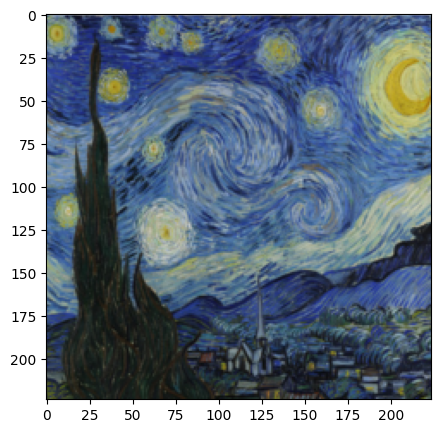

tensor([[[[0.4706, 0.5137, 0.5569,  ..., 0.4706, 0.5137, 0.5882],
          [0.2667, 0.3882, 0.5176,  ..., 0.1961, 0.2275, 0.4235],
          [0.4549, 0.5608, 0.5020,  ..., 0.2588, 0.2745, 0.3137],
          ...,
          [0.2118, 0.3373, 0.3216,  ..., 0.1020, 0.1608, 0.1765],
          [0.1804, 0.2667, 0.2314,  ..., 0.2353, 0.2627, 0.2863],
          [0.2000, 0.2824, 0.3373,  ..., 0.3961, 0.3216, 0.2863]],

         [[0.5255, 0.5922, 0.6118,  ..., 0.4941, 0.5608, 0.6588],
          [0.3686, 0.5059, 0.6000,  ..., 0.2588, 0.2863, 0.5098],
          [0.5333, 0.6275, 0.5725,  ..., 0.3412, 0.3412, 0.3804],
          ...,
          [0.2510, 0.3765, 0.3608,  ..., 0.1216, 0.2157, 0.2471],
          [0.2118, 0.3137, 0.2510,  ..., 0.2706, 0.3216, 0.3490],
          [0.2314, 0.3333, 0.3843,  ..., 0.4549, 0.3843, 0.3529]],

         [[0.6157, 0.6549, 0.6118,  ..., 0.5882, 0.6627, 0.7373],
          [0.4471, 0.4627, 0.4588,  ..., 0.4549, 0.4353, 0.5725],
          [0.5176, 0.4667, 0.4941,  ..., 0

In [ ]:
img_path = "./images/style_img_1.jpg"
style_image_1 = load_image_to_tensor(img_path)
show_tensor_image(style_image_1)
style_image_1

(Gogh, The Starry Night,(n.d.))

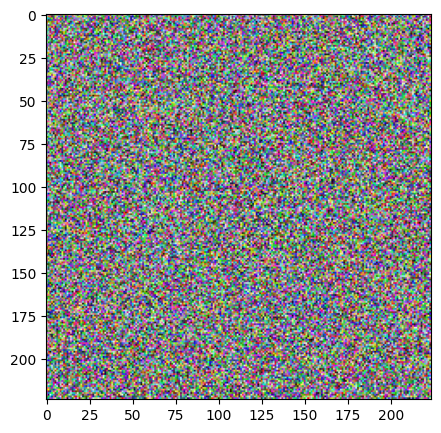

In [ ]:
# noise
input_image = torch.empty_like(style_image_1).uniform_(0, 1).to(device)
show_tensor_image(input_image)

In [ ]:
style_layers_list = ["conv1_1", "conv1_2", "conv2_1", "conv2_2", "conv3_1"]

>> Current Iteration: 0


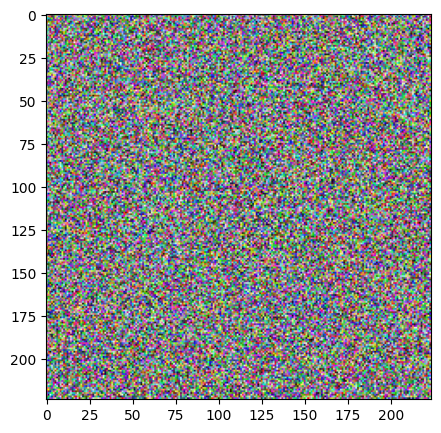

>> Current Iteration: 50 , Style loss: 13.4067


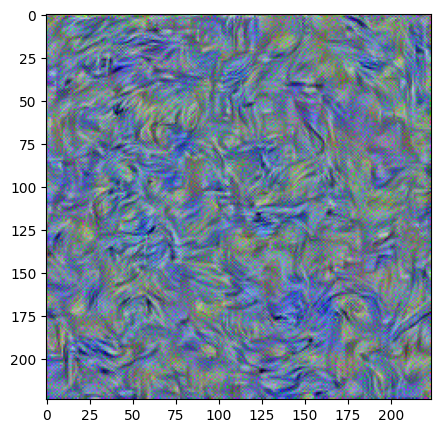

>> Current Iteration: 100 , Style loss: 3.8499


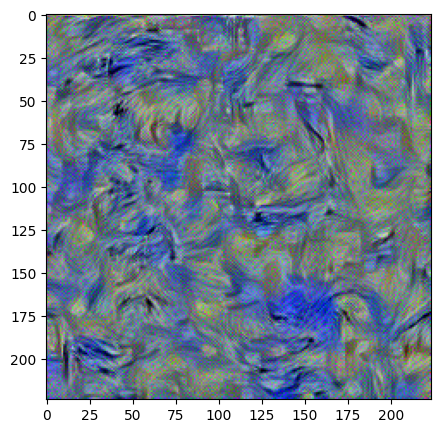

>> Current Iteration: 150 , Style loss: 1.5484


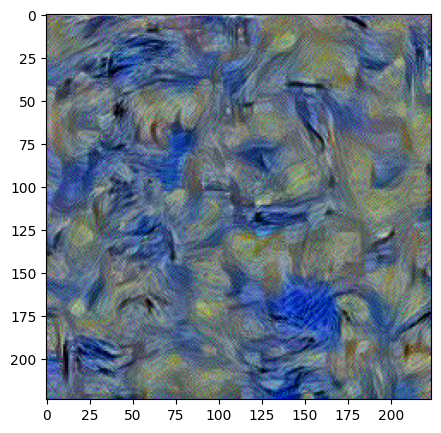

>> Current Iteration: 200 , Style loss: 0.7132


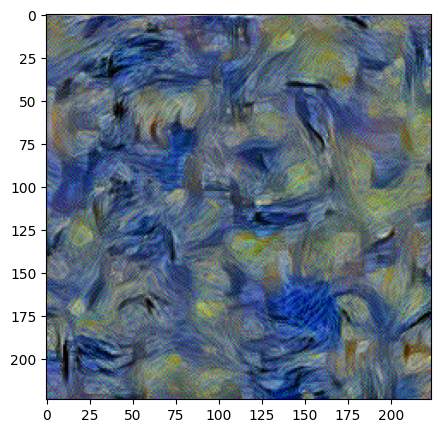

>> Current Iteration: 250 , Style loss: 0.4523


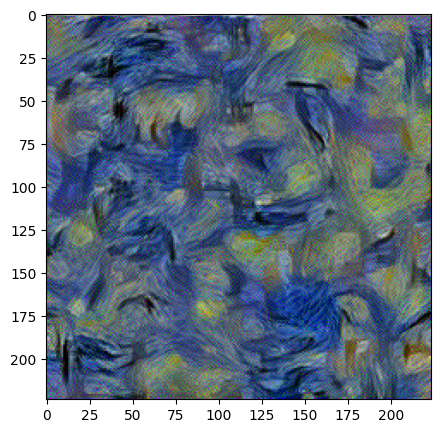

>> Current Iteration: 300 , Style loss: 0.3433


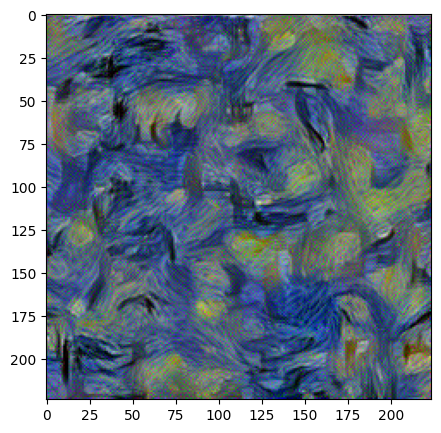

In [ ]:
# style reconstruction
output = reconstruct_style_image(
    vgg_model, style_image_1, input_image, style_layers_list, progress=True
)

### Experiment using different layers as the ones to extract style information from and observe the differences in the resulting stylized images.

In [ ]:
vgg_conv_layers

['conv1_1',
 'conv1_2',
 'conv2_1',
 'conv2_2',
 'conv3_1',
 'conv3_2',
 'conv3_3',
 'conv3_4',
 'conv4_1',
 'conv4_2',
 'conv4_3',
 'conv4_4',
 'conv5_1',
 'conv5_2',
 'conv5_3',
 'conv5_4']

### Lower layers

In [ ]:
lower_style_layers = [["conv1_1"], ["conv1_2"], ["conv2_1"], ["conv2_2"], ["conv3_1"]]

>> ['conv1_1']


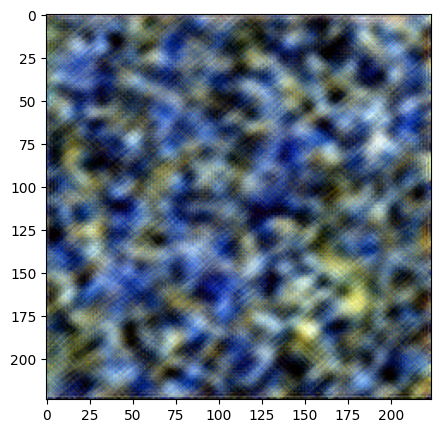

>> ['conv1_2']


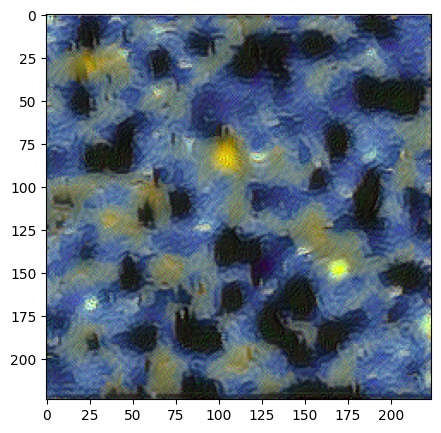

>> ['conv2_1']


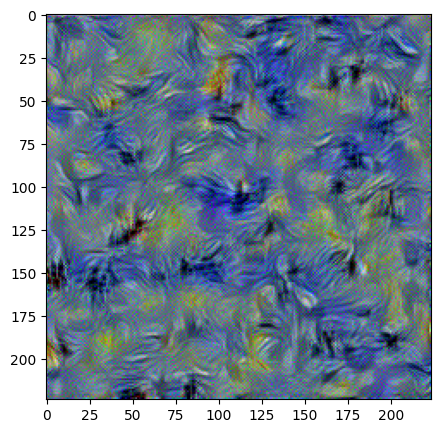

>> ['conv2_2']


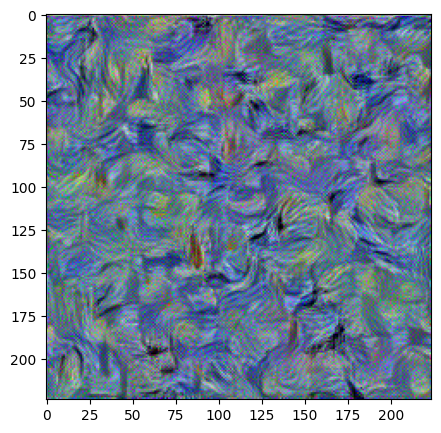

>> ['conv3_1']


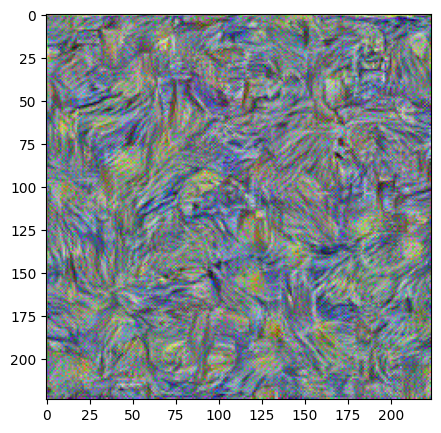

In [ ]:
for style_layers in lower_style_layers:
    input_image = torch.empty_like(style_image_1).uniform_(0, 1).to(device)
    print(f">> {style_layers}")
    output = reconstruct_style_image(
        vgg_model, style_image_1, input_image, style_layers
    )
    show_tensor_image(output)

### Middle layers

In [ ]:
middle_style_layers = [["conv3_2"], ["conv3_3"], ["conv3_4"], ["conv4_1"], ["conv4_2"]]

In [ ]:
for style_layers in middle_style_layers:
    input_image = torch.empty_like(style_image_1).uniform_(0, 1).to(device)
    print(f">> {style_layers}")

    output = reconstruct_style_image(
        vgg_model, style_image_1, input_image, style_layers
    )
    show_tensor_image(output)

### Higher layers

In [ ]:
higher_style_layers = [
    ["conv4_3"],
    ["conv4_4"],
    ["conv5_1"],
    ["conv5_2"],
    ["conv5_3"],
    ["conv5_4"],
]

In [ ]:
for style_layers in higher_style_layers:
    input_image = torch.empty_like(style_image_1).uniform_(0, 1).to(device)
    print(f">> {style_layers}")

    output = reconstruct_style_image(
        vgg_model, style_image_1, input_image, style_layers
    )
    show_tensor_image(output)

### Combinations of different layers (number of layers = 2)

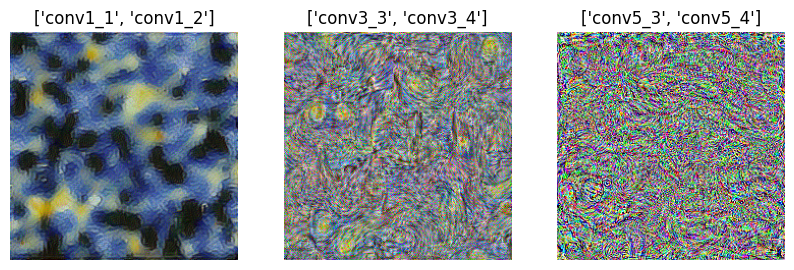

In [ ]:
random_combination_style_layers = [
    ["conv1_1", "conv1_2"],
    ["conv3_3", "conv3_4"],
    ["conv5_3", "conv5_4"],
]


fig, axs = plt.subplots(1, 3, figsize=(10, 5))

for i, style_layers in enumerate(random_combination_style_layers):
    input_image = torch.empty_like(style_image_1).uniform_(0, 1).to(device)
    image_tensor = reconstruct_style_image(
        vgg_model, style_image_1, input_image, style_layers
    )
    axs[i].imshow(image_tensor.cpu().detach().squeeze().permute(1, 2, 0).numpy())
    axs[i].set_title(style_layers)
    axs[i].axis("off")

plt.show()

### Combinations of different layers (number of layers = 3)

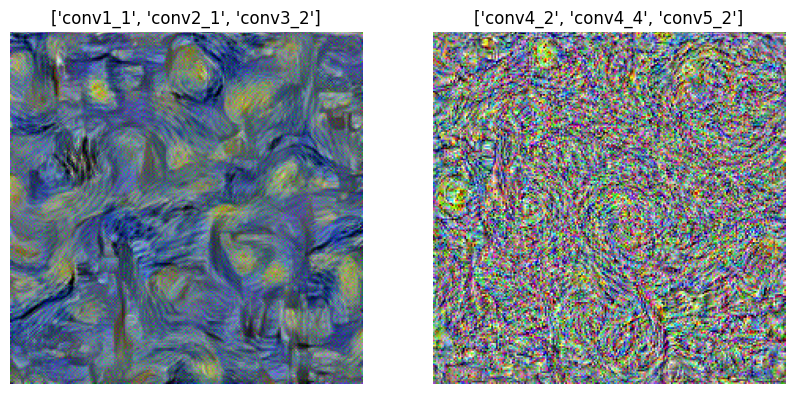

In [ ]:
random_combination_style_layers2 = [
    ["conv1_1", "conv2_1", "conv3_2"],
    ["conv4_2", "conv4_4", "conv5_2"],
]

fig, axs = plt.subplots(1, 2, figsize=(10, 5))

for i, style_layers in enumerate(random_combination_style_layers2):
    input_image = torch.empty_like(style_image_1).uniform_(0, 1).to(device)
    image_tensor = reconstruct_style_image(
        vgg_model, style_image_1, input_image, style_layers
    )
    axs[i].imshow(image_tensor.cpu().detach().squeeze().permute(1, 2, 0).numpy())
    axs[i].set_title(style_layers)
    axs[i].axis("off")

plt.show()

**Observation:** combinations of lower layers tend to give style closer to the original image

## **Style Transfer with vgg19**

In [ ]:
def reconstruct_model_with_style_and_content_losses(
    pre_trained_model,
    style_image,
    content_image,
    style_layers_list,
    content_layers_list,
):
    """
    Reconstructs a new model using a pre-trained model, a style image, and a content image. The new model includes
    StyleLoss and ContentLoss objects that are used to calculate the style and content losses between the input image
    and the style and content images. The reconstructed model can then be used for neural transfer.
    This is a helper function used inside 'style_transfer' function defined latter part of this project.

    Arguments
    ---------
    - pre_trained_model: Pre-trained PyTorch model (e.g. VGG19)
    - style_image: A style image tensor
    - content_image: A content image tensor
    - style_layers_list: List of layer names to use for calculating style loss
    - content_layers_list: List of layer names to use for calculating content loss

    Returns:
    - my_model: Reconstructed model
    - style_losses: List of StyleLoss objects. This will be used to calculate total style loss
    - content_losses: List of ContentLoss objects. This will be used to calculate total content loss

    Reference
    ---------
    -Based on Jacq's work on Neural transfer using PyTorch (Jacq, 2021), I re-wrote the code.
    """

    # pytorch's neural network library has nn.Module class, which is base class of neural network module.
    # the forward method is automatically called when the object is called.
    class StyleLoss(nn.Module):
        # initialization
        def __init__(
            self, target_tensor_features
        ):  # target is the chosen layer in style_image
            super(StyleLoss, self).__init__()
            self.target_style = gram_matrix(
                target_tensor_features
            ).detach()  # define target style and set to instance attribute

        # when the object is called, get gram_matrix for updating image then compute loss with gram_matrix for target style image
        def forward(self, input_tensor_features):
            input_gram = gram_matrix(input_tensor_features)
            self.loss = nn.functional.mse_loss(input_gram, self.target_style)
            return input_tensor_features

    class ContentLoss(nn.Module):
        # initialization
        def __init__(self, content_tensor):
            super(ContentLoss, self).__init__()
            self.target_concent = content_tensor.detach()

        def forward(self, input_tensor):
            self.loss = nn.functional.mse_loss(input_tensor, self.target_concent)
            return input_tensor

    # given mean and std for vgg19
    vgg19_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
    vgg19_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

    # initialize normalization object
    normalization = Normalization(vgg19_mean, vgg19_std).to(device)
    style_losses = []  # will contain losses for multiple layers. One loss per layer.
    content_losses = []  # will contain losses for content layer
    # initialize sequential obejct to make our own model
    my_model = nn.Sequential()

    # make sure the input image to my_model is nomralized
    my_model.add_module("normalization", normalization)

    # deepcopy pre_trained_model to not to change by accident
    pre_trained_model = copy.deepcopy(pre_trained_model)

    i = 1
    j = 0
    for layer in vgg_model.children():
        if isinstance(layer, nn.Conv2d):
            j += 1  # untill we encounter conv2d layer
            name = f"conv{i}_{j}"
        elif isinstance(layer, nn.ReLU):
            name = f"relu{i}_{j}"
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f"pool{i}"
            i += 1  # untill we encounter maxpool layer
            j = 0

        else:
            raise RuntimeError(f"Unrecognized layer: {layer.__class__.__name__}")

        my_model.add_module(name, layer)

        # calculate loss up untill the chosen layers
        if name in style_layers_list:
            style_tensor_features = my_model(
                style_image
            ).detach()  # extract activation values of a chosen layer
            style_loss_obj = StyleLoss(
                style_tensor_features
            )  # initialize StyleLoss object
            my_model.add_module(
                f"styleLossObj{i}_{j}", style_loss_obj
            )  # add that object to our sequential model
            style_losses.append(style_loss_obj)  # append to style_losses lislt

        if name in content_layers_list:
            content_tensor_features = my_model(content_image).detach()
            content_loss_obj = ContentLoss(content_tensor_features)
            my_model.add_module(f"contentLossObj{i}_{j}", content_loss_obj)
            content_losses.append(content_loss_obj)

    # cut model upto the last Loss object layer
    for k in range(len(my_model) - 1, -1, -1):
        if isinstance(my_model[k], StyleLoss) or isinstance(my_model[k], ContentLoss):
            break
    my_model = my_model[: (k + 1)]

    return my_model, style_losses, content_losses

In [ ]:
def style_transfer(
    pre_trained_model,
    style_image,
    content_image,
    input_image,
    style_layers_list,
    content_layers_list,
    n_iterations=300,
    weight=1e5,
    progress=False,
):
    """
    A function that performs neural style transfer on a given content image with a given style image using a pre-trained model.

    Arguments
    ---------
    pre_trained_model: A pre-trained neural network model to be used for style transfer.
    style_image: A style image tensor to be used for style transfer.
    content_image: A content image tensor to be used for style transfer.
    input_image: A tensor image on which style transfer will be applied.
    style_layers_list: A list of the names of the layers in the pre-trained model to be used for style transfer.
    content_layers_list: A list of the names of the layers in the pre-trained model to be used for content transfer.
    n_iterations: The number of iterations for optimization. Default value is 300.
    weight: The weight parameter to control the contribution of style loss in the final loss calculation. Default value is 1e5.
    progress: A boolean flag to indicate if the progress should be printed. Default value is False.

    Returns
    -------
    The input image tensor with the transferred style.
    """

    (
        my_model,
        style_losses,
        content_losses,
    ) = reconstruct_model_with_style_and_content_losses(
        pre_trained_model,
        style_image,
        content_image,
        style_layers_list,
        content_layers_list,
    )
    optimizer = optim.LBFGS(
        [input_image.requires_grad_()]
    )  # LBFGS converges faster than other optimizer like GD or SGD

    if progress is True:
        print(">> Current Iteration: 0")
        show_tensor_image(input_image)

    current_iteration = 0
    while current_iteration <= n_iterations:

        def closure():
            nonlocal current_iteration
            input_image.data.clamp_(0, 1)

            optimizer.zero_grad()  # clear previous gradient
            my_model(input_image)
            total_style_loss = 0
            total_content_loss = 0

            # the total style loss is calculated after the my_model is called
            # inisde my_model we added the StyleLoss object which will calculate loss by calling forward method.
            # .loss is the attribute of StyleLoss object.
            for sl in style_losses:
                total_style_loss += (
                    sl.loss
                )  # remember that the total style loss is the sum of all the losses calculatad for each chosen layer

            for cl in content_losses:
                total_content_loss += cl.loss

            total_style_loss *= weight
            total_loss = total_style_loss + total_content_loss
            total_loss.backward()  # compute gradient

            current_iteration += 1
            if progress is True and current_iteration % 50 == 0:
                print(
                    f">> Current Iteration: {current_iteration} , Style loss: {total_style_loss:.4f}, Content Loss: {total_content_loss:.4f}"
                )
                show_tensor_image(input_image)

            return total_loss

        optimizer.step(closure)  # update parameters

    input_image.data.clamp_(0, 1)

    return input_image

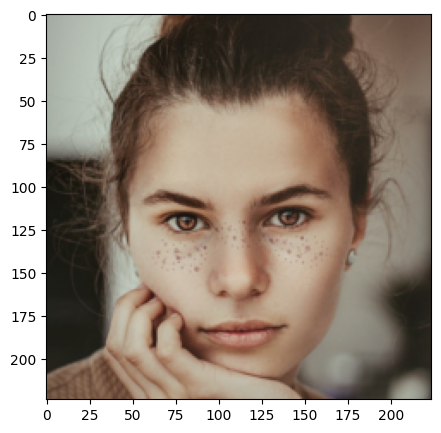

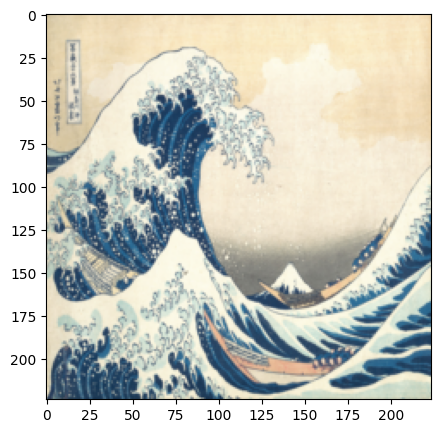

In [ ]:
img_path = "./images/content_img_3.jpg"
content_image_3 = load_image_to_tensor(img_path)
show_tensor_image(content_image_3)


img_path = "./images/style_img_2.jpg"
style_image_2 = load_image_to_tensor(img_path)
show_tensor_image(style_image_2)

Up: (Ncib, smiling woman holding cheek 2019) <br>
Down: (Katsushika , Under the Wave off Kanagawa (Kanagawa oki nami ura),ca. 1830–32)



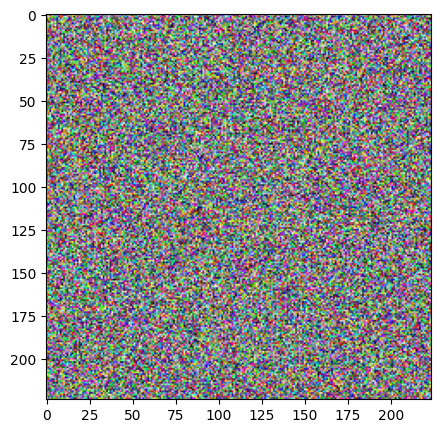

In [ ]:
# noise
input_image = torch.empty_like(content_image_2).uniform_(0, 1).to(device)
show_tensor_image(input_image)

>> Current Iteration: 0


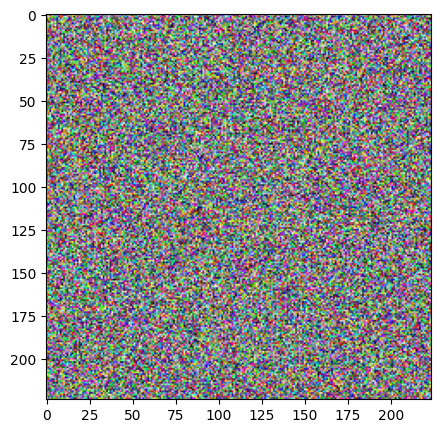

>> Current Iteration: 50 , Style loss: 8.6684, Content Loss: 25.3070


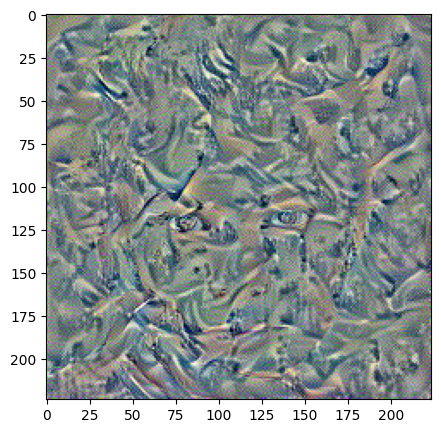

>> Current Iteration: 100 , Style loss: 5.0528, Content Loss: 18.7694


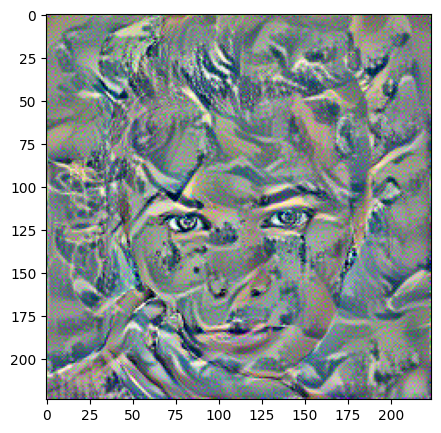

>> Current Iteration: 150 , Style loss: 3.9404, Content Loss: 15.5128


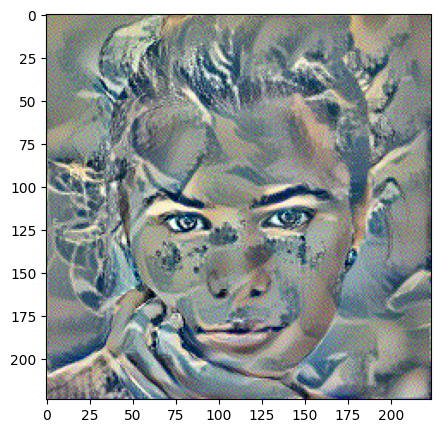

>> Current Iteration: 200 , Style loss: 3.4239, Content Loss: 13.6733


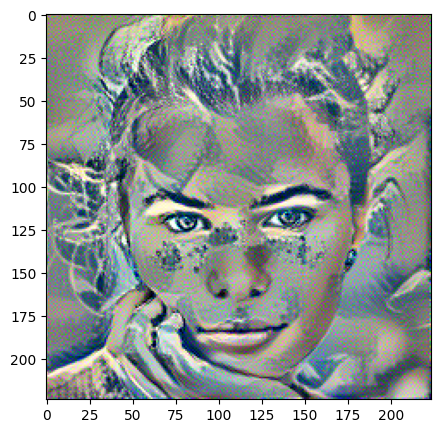

>> Current Iteration: 250 , Style loss: 3.0871, Content Loss: 12.6306


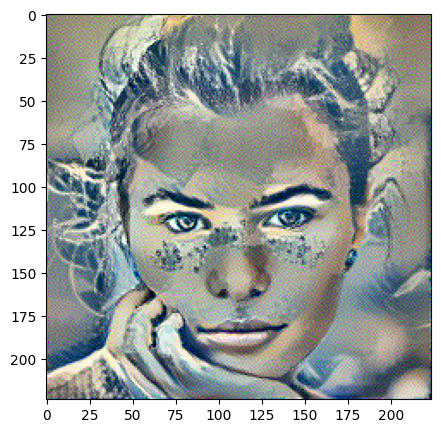

>> Current Iteration: 300 , Style loss: 2.8521, Content Loss: 12.0147


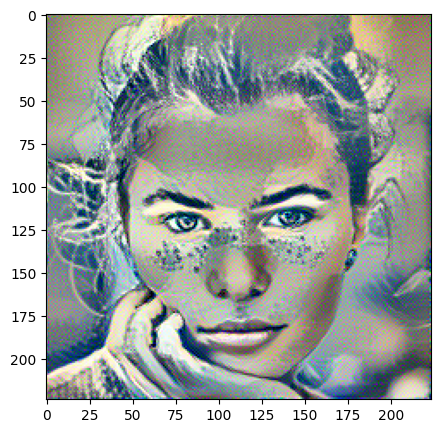

>> Current Iteration: 350 , Style loss: 2.6042, Content Loss: 11.8559


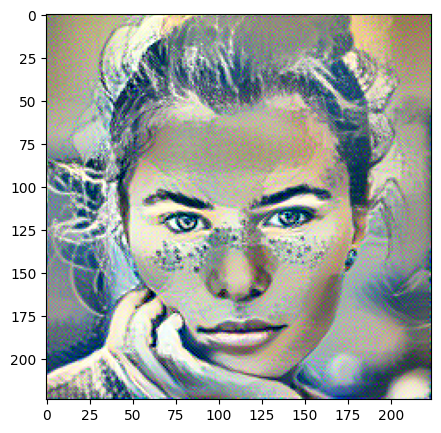

>> Current Iteration: 400 , Style loss: 2.4004, Content Loss: 11.6559


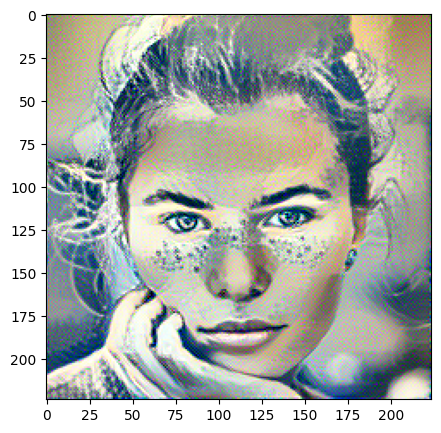

In [ ]:

content_layers = ["conv2_2"]
style_layers = ["conv1_2", "conv2_1", "conv2_2", "conv3_2"]


# style transfer
output = style_transfer(
    vgg_model,
    style_image_2,
    content_image_3,
    input_image,
    style_layers,
    content_layers,
    n_iterations=400,
    weight=1e4,
    progress=True,
)

In [ ]:
content_layers = ["conv4_1"]
style_layers = ["conv1_1", "conv2_1", "conv3_2"]

# noise image
input_image = torch.empty_like(content_image_2).uniform_(0, 1).to(device)

# style transfer
output = style_transfer(
    vgg_model,
    style_image_1,
    content_image_2,
    input_image,
    style_layers,
    content_layers,
    n_iterations=600,
    weight=1e5,
    progress=True,
)

**Observation**: We can see that both the style and content loss decrease as the number of iterations increases. Additionally, adjusting the weight of the style can affect the output of the style transfer, with higher weights giving more prominence to the style.

## **Conclusion & What's learned**

It is fascinating that different features can be extracted from each layer of a neural network model, which can be used to extract the style from an image. Additionally, using the VGG19 model trained on a large amount of training images saves the effort of manually searching for and training on thousands of data.

However, it is difficult to find the appropriate layers to be used for style transfer and to determine how much weight to apply to them as hyperparameters. To achieve optimal results, a lot of trial and error is required, but since transferring the style of a single image takes longer than expected, it is difficult to try all combinations in a timely manner.

## **Proposal vs. Project**

In my attempt to generate images using AI, specifically the DALE-E-2 model, I encountered difficulty in producing a satisfactory output. Also the CK+ dataset, which I found to have weak colors. Consequently, I opted to use free online human images from Unsplash instead.

Moreover, my original objective was to create a pop-art-like image, but I encountered challenges with the model applying the style to the color of the person's face. This highlighted the need for a clearer distinction between the background and the person's face.

## **Future Experiment**

I think a more pop-art-like effect could be achieved by applying a toonify effect to the human face, masking the person, and then reconstructing the background using style transfer.

## **References**

[1] Gatys, L. A., Ecker, A. S., &amp; Bethge, M. (1970, January 1). Image style transfer using Convolutional Neural Networks. CVF Open Access. Retrieved April 23, 2023, from https://openaccess.thecvf.com/content_cvpr_2016/html/Gatys_Image_Style_Transfer_CVPR_2016_paper.html

[2] Gonzalez, J. (2017). Man wearing white B-neck shirt. unsplash. Retrieved April 23, 2023, from https://unsplash.com/photos/iFgRcqHznqg.

[3] Nackos, J. (2020). Woman in white crew neck shirt smiling. unsplash. Retrieved from https://unsplash.com/photos/IF9TK5Uy-KI.

[4] Gogh, V. van. (n.d.). The Starry Night. MOMA-Museum of Modern Art. Retrieved from https://www.moma.org/collection/works/79802.

[5] Katsushika , H. (n.d.). Under the Wave off Kanagawa (Kanagawa oki nami ura). The Metropolitan Museum of Art. Retrieved from https://www.metmuseum.org/art/collection/search/45434.

[6] Jacq, A. (n.d.). Neural transfer using pytorch¶. Neural Transfer Using PyTorch - PyTorch Tutorials 2.0.0+cu117 documentation. Retrieved April 23, 2023, from https://pytorch.org/tutorials/advanced/neural_style_tutorial.html

[7] Smiling woman holding cheek. (2019). unsplash. Retrieved from https://unsplash.com/photos/B4TjXnI0Y2c.